# Schedule TPC-DS 10 Descriptor

This notebook contains work pertatining to pattern learning / identification for a database workload schedule. It contains descriptors of the available data through plot visualizations, so as to better understand which resource play a part into reflecting underlying workloads. This notebook is one of four, which individually analyze four distinct datasets:

* REP_HIST_SNAPSHOT
* __REP_HIST_SYSMETRIC_SUMMARY__
* REP_HIST_SYSSTAT
* REP_VSQL_PLAN

## Data Preprocessing

### Module Installation and Importing Libraries

In [1]:
# Module Import
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

### Configuration Cell

Tweak parametric changes from this cell to influence outcome of experiment. 

* tpcds - Schema upon which to operate test.
* nrows - Number of rows to read from csv file.
* dtype - Pandas type inferring when opening CSV file.

In [2]:
tpcds='TPCDS10'
nrows=None
dtype={'SNAP_ID':int,
      'STAT_NAME':str,
      'AVERAGE':float}

### Read data from file into Pandas Dataframes

Open CSV files, and prettify feature column names by removing non-needed characters.

In [3]:
# Root path
#root_dir = 'C:/Users/gabriel.sammut/University/Data_ICS5200/Schedule/' + tpcds
root_dir = 'D:/Projects/Datagenerated_ICS5200/Schedule/' + tpcds

# Open Data
rep_hist_sysmetric_summary_path = root_dir + '/rep_hist_sysmetric_summary.csv'

rep_hist_sysmetric_summary_df = pd.read_csv(rep_hist_sysmetric_summary_path,
                                            nrows=nrows,
                                            dtype=dtype)

def prettify_header(headers):
    """
    Cleans header list from unwated character strings
    """
    header_list = []
    [header_list.append(header.replace("(","").replace(")","").replace("'","").replace(",","")) for header in headers]
    return header_list

rep_hist_sysmetric_summary_headers = prettify_header(rep_hist_sysmetric_summary_df.columns.values)

# Replace original headers with a prettified version of the same column list
rep_hist_sysmetric_summary_df = pd.read_csv(rep_hist_sysmetric_summary_path, names=rep_hist_sysmetric_summary_headers)

rep_hist_sysmetric_summary_df.drop(rep_hist_sysmetric_summary_df.index[0],inplace=True)

print(rep_hist_sysmetric_summary_df.head())

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3018: DtypeWarning: Columns (0,1,2,5,6,7,10,11,12,13,14,15,16,17,20,21,22,24,25) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


  SNAP_ID        DBID INSTANCE_NUMBER           BEGIN_TIME  \
1   63246  2634225673               1  2018-11-30 17:31:06   
2   63246  2634225673               1  2018-11-30 17:31:06   
3   63246  2634225673               1  2018-11-30 17:31:06   
4   63246  2634225673               1  2018-11-30 17:31:06   
5   63246  2634225673               1  2018-11-30 17:31:06   

              END_TIME INTSIZE GROUP_ID METRIC_ID                METRIC_NAME  \
1  2018-11-30 17:32:06    6004        2      2000     Buffer Cache Hit Ratio   
2  2018-11-30 17:32:06    6004        2      2001         Memory Sorts Ratio   
3  2018-11-30 17:32:06    6004        2      2002  Redo Allocation Hit Ratio   
4  2018-11-30 17:32:06    6004        2      2003   User Transaction Per Sec   
5  2018-11-30 17:32:06    6004        2      2004     Physical Reads Per Sec   

                      METRIC_UNIT      ...         CON_DBID CON_ID  \
1   % (LogRead - PhyRead)/LogRead      ...       2634225673      0   
2  % M

### Checking for NaN Values

Checking dataframes for potential missing values/data:

In [4]:
def get_na_columns(df):
    """
    Return columns which consist of NAN values
    """
    na_list = []
    for head in df.columns:
        if df[head].isnull().values.any():
            na_list.append(head)
    return na_list

print("Table REP_HIST_SYSMETRIC_SUMMARY: " + str(get_na_columns(df=rep_hist_sysmetric_summary_df)) + "\n\n")

def fill_na(df):
    """
    Replaces NA columns with 0s
    """
    return df.fillna(0)

# Populating NaN values with amount '0'
rep_hist_sysmetric_summary_df = fill_na(df=rep_hist_sysmetric_summary_df)

Table REP_HIST_SYSMETRIC_SUMMARY: ['SNAP_FLAG', 'SNAP_TIMEZONE']




# Dataset Description

All data sources are retrieved from Oracle defined tables/views. These sources have been specifically chosen because they accurately portray a database system under load, across a period of time. Such data sources were polled at regular intervals (60 seconds), and recorded into intermediatery tables for future data mining potential. Each statistic set corresponds to a 'SNAP_ID', which quantifies a particular resource usage at a point in time. 'SNAP_ID' delta equates to 60 seconds. In addition, relavent SQL access plans taken during the workloads execution were also captured.

Statistical calculations:
* Column Names
* Dataframe Row Counts
* Mean (were applicable)
* Standard Dev (were applicable)
* Quartile Percentile
* Min / Max

In [5]:
print('-----------------------------------------------------------')
print('Dataframe Row Count: REP_HIST_SYSMETRIC_SUMMARY - ' + str(len(rep_hist_sysmetric_summary_df)))
print('-----------------------------------------------------------\n')

print('\n\nREP_HIST_SYSMETRIC_SUMMARY:')
print(rep_hist_sysmetric_summary_df.describe())

rep_hist_sysmetric_summary_df['SNAP_ID'] = rep_hist_sysmetric_summary_df['SNAP_ID'].astype(int)
min_id = rep_hist_sysmetric_summary_df['SNAP_ID'].min()
max_id = rep_hist_sysmetric_summary_df['SNAP_ID'].max()
print('Mininum SNAP_ID [' + str(min_id) + ']')
print('Maximum SNAP_ID [' + str(max_id) + ']')

-----------------------------------------------------------
Dataframe Row Count: REP_HIST_SYSMETRIC_SUMMARY - 2086076
-----------------------------------------------------------



REP_HIST_SYSMETRIC_SUMMARY:
       SNAP_FLAG  SNAP_TIMEZONE
count  2086076.0      2086076.0
mean         0.0            0.0
std          0.0            0.0
min          0.0            0.0
25%          0.0            0.0
50%          0.0            0.0
75%          0.0            0.0
max          0.0            0.0
Mininum SNAP_ID [63246]
Maximum SNAP_ID [76339]


# Dataset Extraction

The above datasets were extracted from the following user defined tables:
* REP_HIST_SYSMETRIC_SUMMARY

Each table corresponds to an Oracle defined table, whose sole function is to offload data from Oracle defined tables (which tend to have a retention period) into a user defined table. Table REP_HIST_SNAPSHOT, REP_HIST_SYSMETRIC_SUMMARY and REP_HIST_SYSSTAT can be joined through the 'SNAP_ID' column. Table REP_VSQL_PLAN can be joined to REP_HIST_SNAPSHOT through the 'SQL_ID' column.

For table REP_HIST_SYSMETRIC_SUMMARY, the Oracle history table DBA_HIST_SNAPSHOT (https://docs.oracle.com/cd/B19306_01/server.102/b14237/statviews_3177.htm#REFRN23442) was joined with DBA_HIST_SYSMETRIC_SUMMARY (https://docs.oracle.com/cd/E18283_01/server.112/e17110/statviews_4059.htm). This combination contains a history summary of past incurred metrics on the database instance, as well as the amount recorded per metric at a particular established snapshots. The specific query used can be found further below.

``` sql
/*REP_HIST_SYSMETRIC_SUMMARY*/
select dhss.*,
       dhsnap.startup_time,
       dhsnap.flush_elapsed,
       dhsnap.snap_level,
       dhsnap.error_count,
       dhsnap.snap_flag,
       dhsnap.snap_timezone
from DBA_HIST_SYSMETRIC_SUMMARY dhss,
     dba_hist_snapshot dhsnap
where dhss.snap_id = dhsnap.snap_id
and dhss.dbid = dhsnap.dbid
and dhss.instance_number = dhsnap.instance_number
and dhsnap.snap_id between '544' and '545';
```

# Data Visualization

The following section visualizes each dataset through a number of pictorial graphs, so as to better visualize the underlying load distribution. Visualizations will be composed between a mixture of line graphs, which will denote a resource's usage over time. 

Line graphs will plot a single database resource vs a SNAP_ID. The SNAP_ID is an identifier pertaining to captured database statistics at a single point in time. SNAP_IDs are set to capture resources every single minute of a database's workload.

Pie charts will denote resource / metric distribution for the duration of the workload trace.

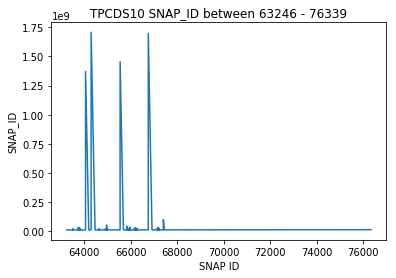

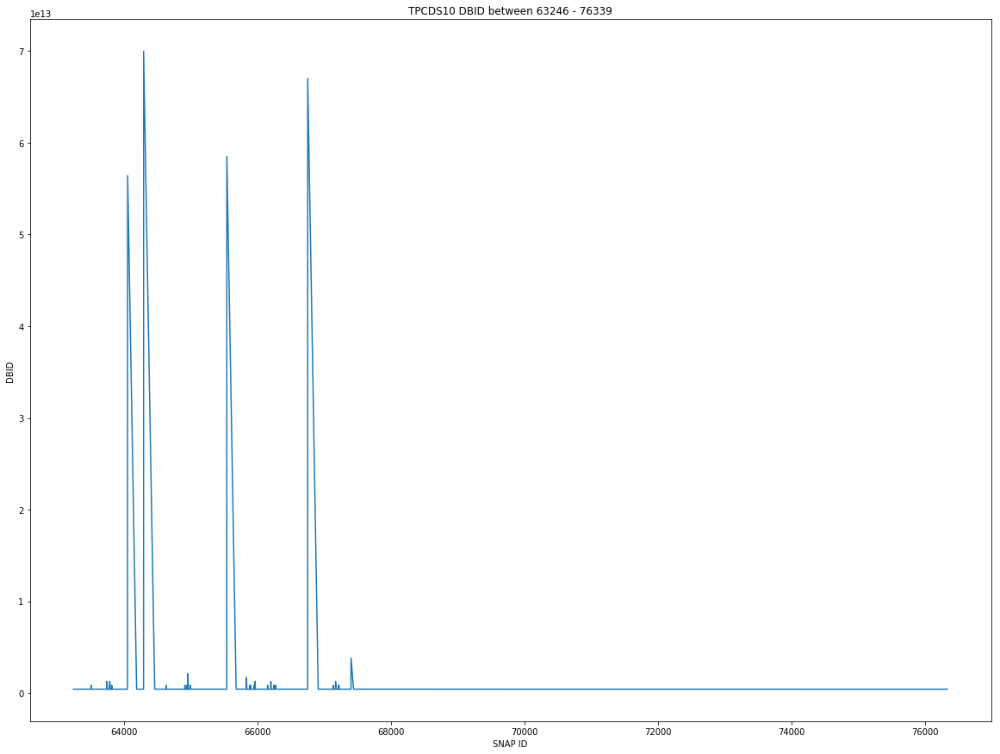

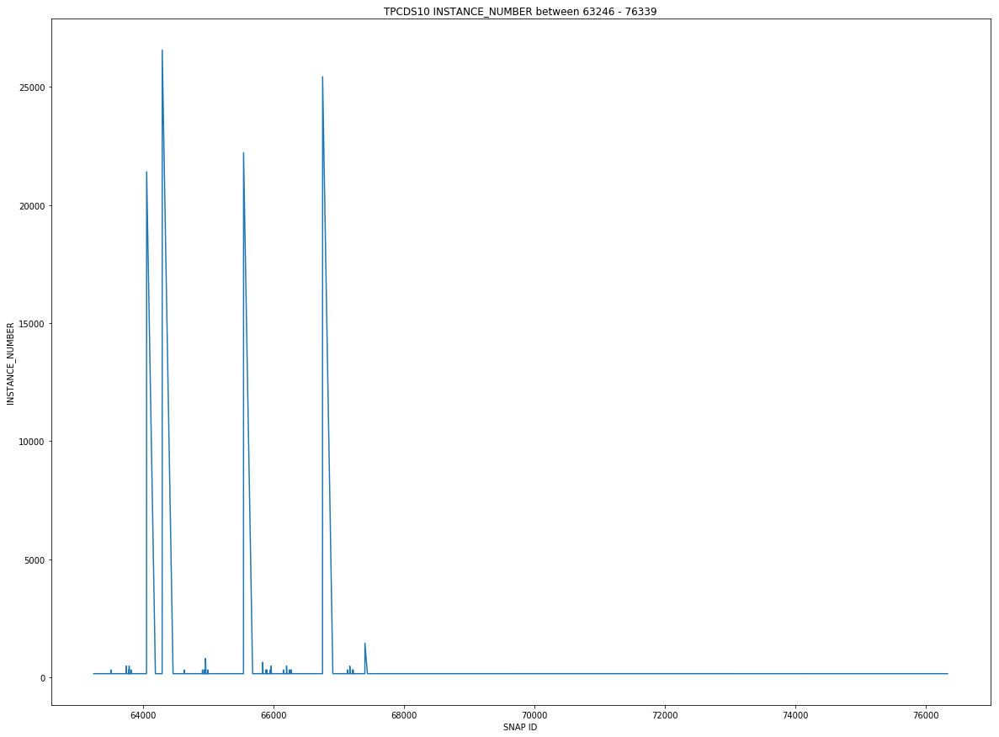

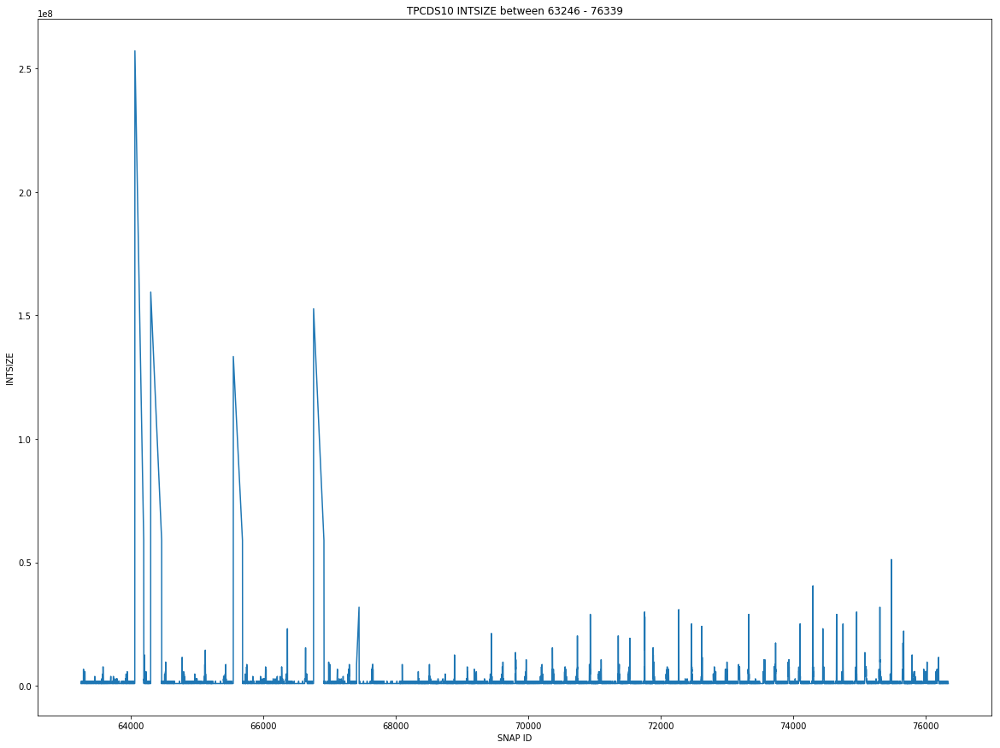

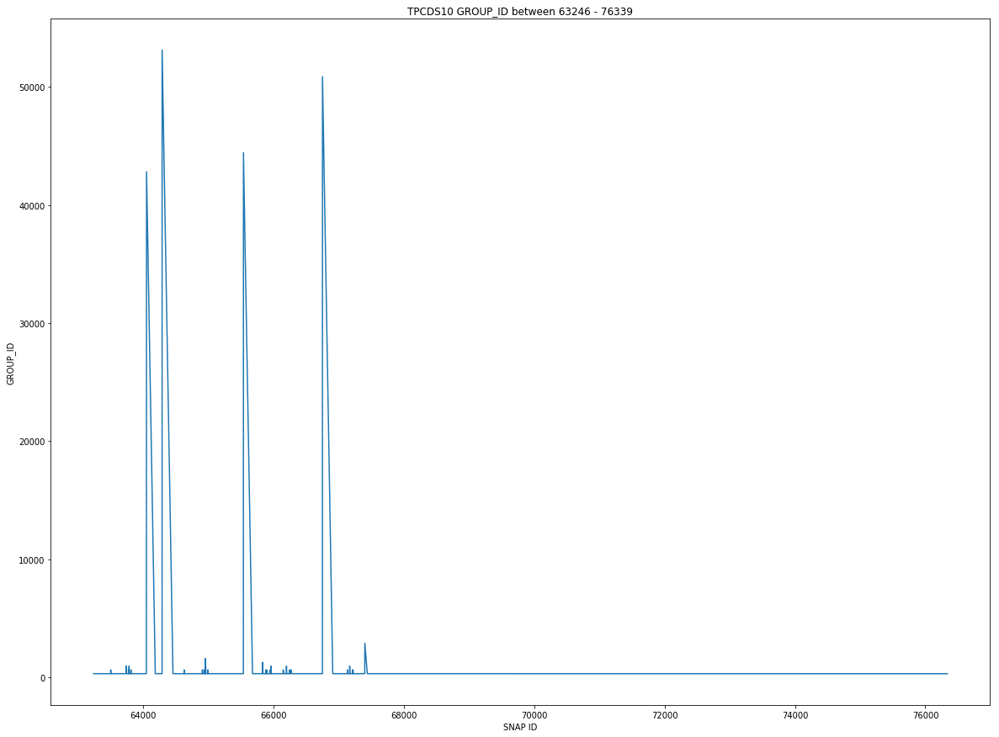

...

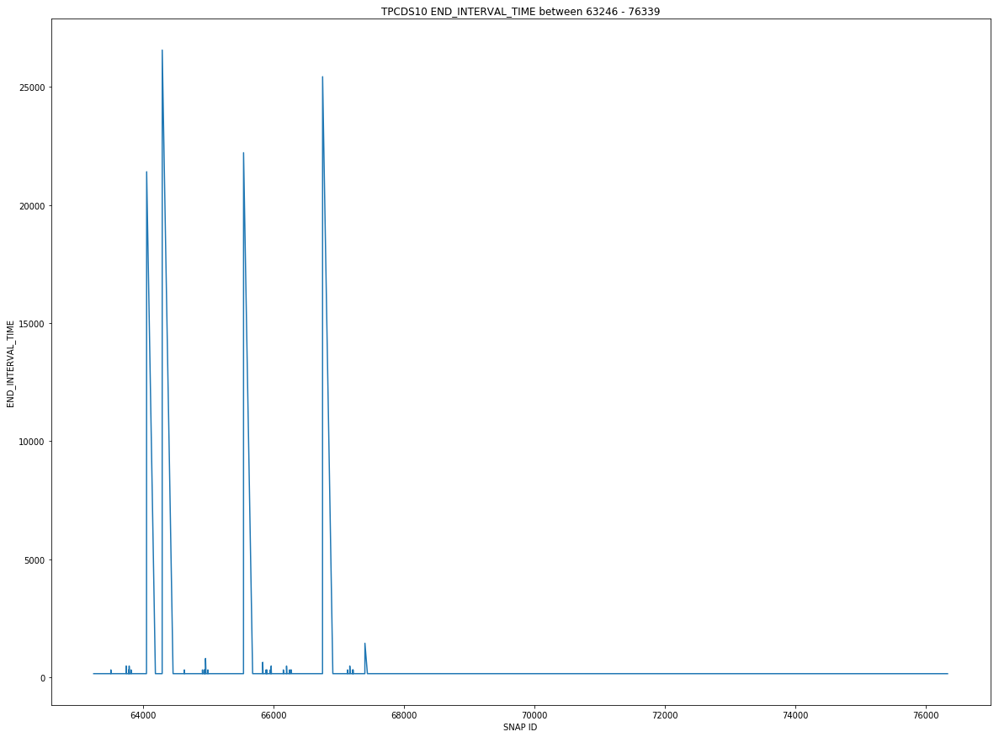

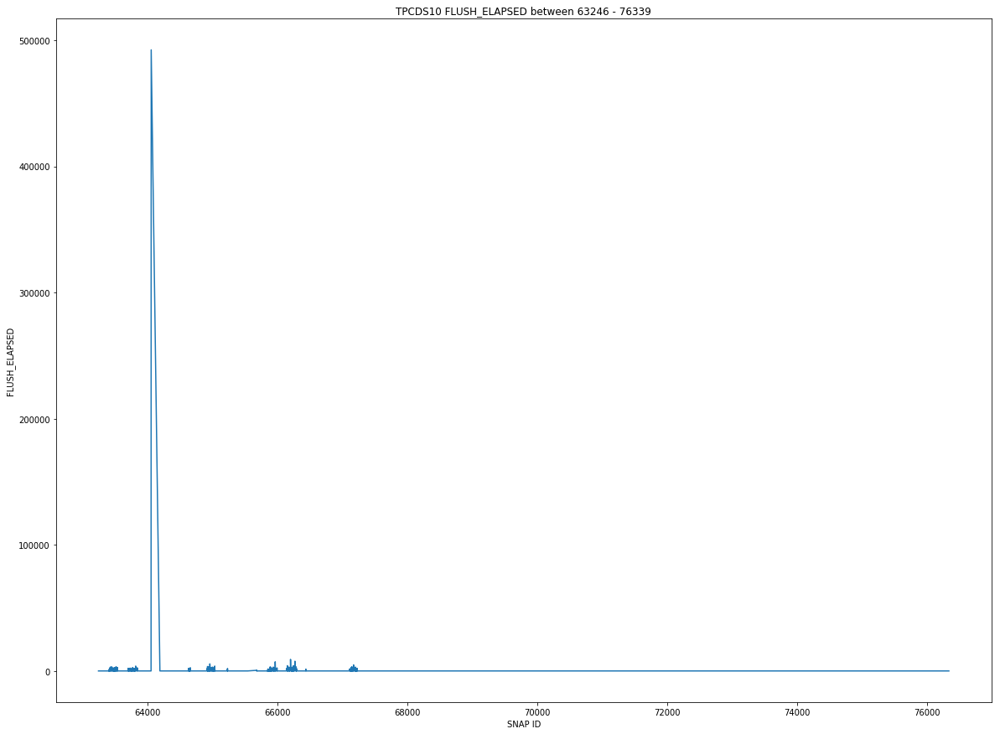

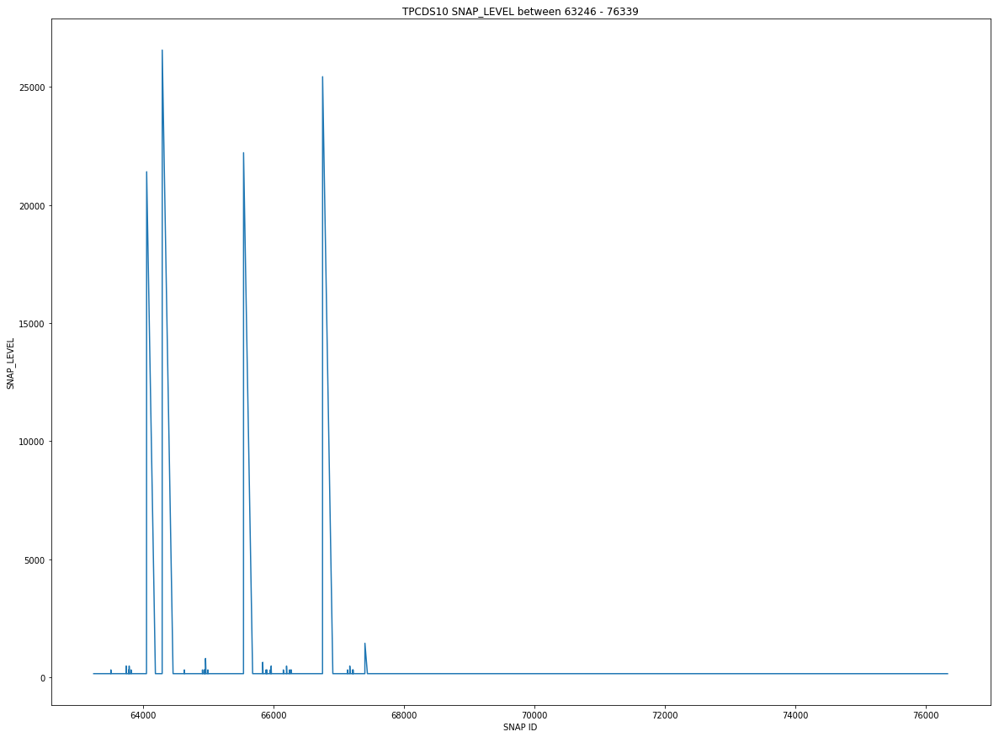

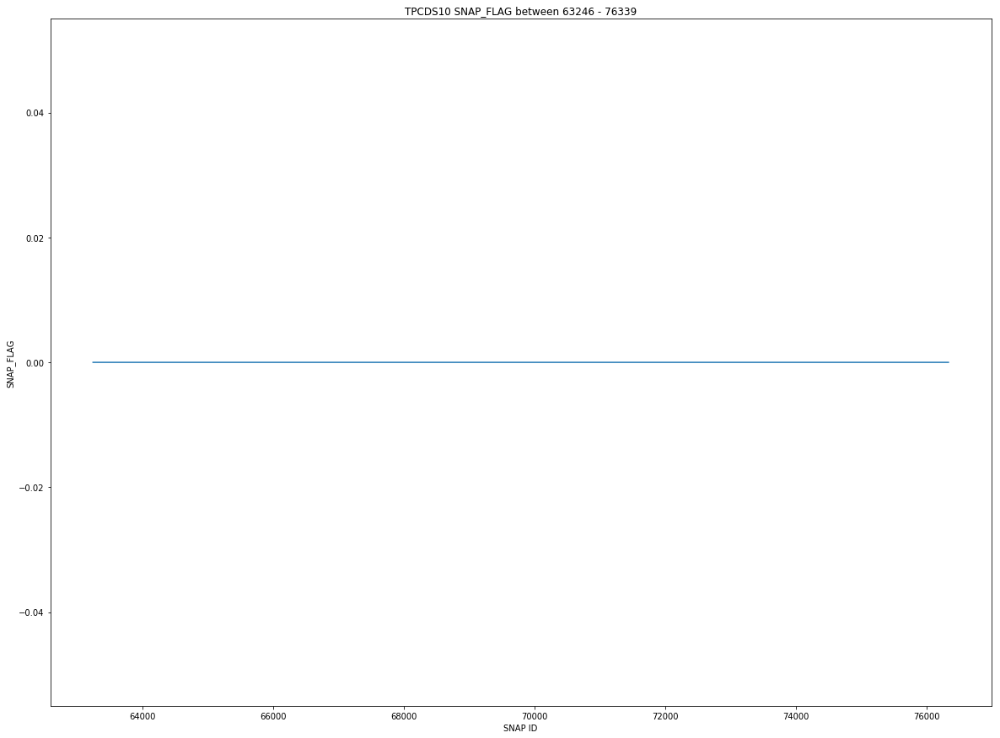

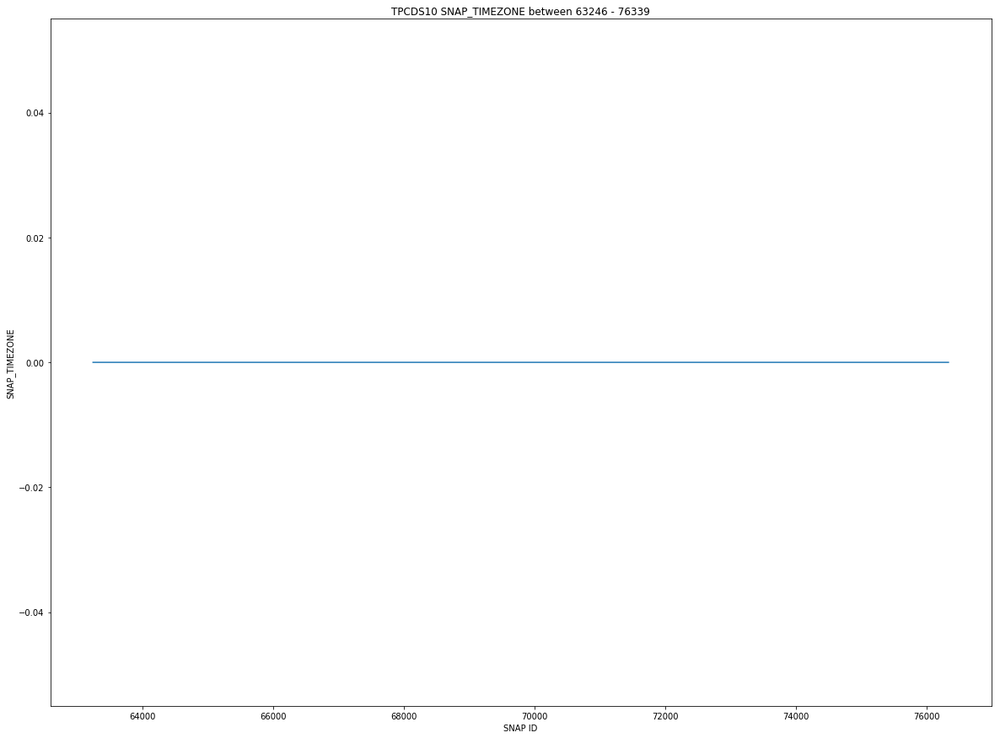

In [6]:
class SnapShotVisualization:
    """
    This class is dedicatedto visualizing collected data over a period of snapshot identifiers.
    """
    def __init__(self, table=None, tpc_type=None, df=None):
        """
        Class constructor.
        :param table:    (String) Denotes which table is going to be utilized. Used for plot purposes.
        :param tpc_type: (String) Denotes which tpc type these experimental plots pertain to.
        :param df:       (Pandas) Data matrix.
        :return: None
        """
        self.__table = table
        self.__tpc_type = tpc_type
        self.__df = df
        
    def plot_snapshot_distribution(self, column):
        """
        Plots line graph, based on input column.
        :param column: (String) Denotes feature column to plot against SNAP_ID feature.
        :return: None
        """
        tpc_type = self.__tpc_type.upper()
        table=self.__table.lower()
        df = self.__df
        
        if column is None or tpc_type is None:
            raise ValueError('Parameters were declared incorrectly!')

        # Convert to float
        try:
            df['SNAP_ID'] = df['SNAP_ID'].astype(float)
            df[column]=df[column].astype(float)
            start_snap, end_snap = int(df['SNAP_ID'].min()), int(df['SNAP_ID'].max())
        except ValueError:
            return None

        # Sort by order of execute time
        df = df.sort_values(by=['SNAP_ID'])

        # Group by SNAP_ID
        df = df.groupby(['SNAP_ID'])[column].sum()

        fig, ax = plt.subplots()
        df.plot(kind='line', x='SNAP_ID', y=column, ax=ax)
        plt.ylabel(column)
        plt.xlabel('SNAP ID')
        plt.title(tpc_type + ' ' + str(column) + " between " + str(start_snap) + " - " + str(end_snap))
        plt.rcParams['figure.figsize'] = [20, 15]
        plt.show()

    def plot_snapshot_ratios(self, column):
        """
        Plots Pie Chart, based on input column.
        :param column: (String) Denotes feature column to plot against SNAP_ID feature.
        :return: None
        """
        tpc_type = self.__tpc_type.upper()
        table=self.__table.lower()
        df = self.__df
        
        if column is None or tpc_type is None:
            raise ValueError('Parameters were declared incorrectly!')

        df = df.groupby([column])[column].count()

        # Sort by operation counts
        series = pd.Series(df.values, index=df.index, name='series')
        series.plot.pie(figsize=(6, 6))
        #plt.xticks([])
        plt.ylabel(column)
        plt.title(tpc_type + ' ' + str(column) + ' Ratio')
        plt.rcParams['figure.figsize'] = [40, 30]
        plt.legend(bbox_to_anchor=(0.95,0.95))
        plt.show()
        
ssv = SnapShotVisualization(table='rep_hist_sysmetric_summary', 
                            tpc_type=tpcds, 
                            df=rep_hist_sysmetric_summary_df)
# Invocation
for header in rep_hist_sysmetric_summary_df.columns:
    ssv.plot_snapshot_distribution(column=header)

### Table Pivots

To better handle the following table, a number of table pivots are made on tables:
* rep_hist_sysmetric_summary

<div style="width:image width px; font-size:80%; text-align:center;"><img src='Images/Pivot.jpg' alt="alternate text" width="width" height="height" style="padding-bottom:0.5em;" /><b>Table Pivot</b></div>

This table transformation takes the STAT_NAME and VALUE metric columns, and pivots the table on the SNAP_ID column. All columns are removed except for (STAT_NAME and VALUE), with rows created per SNAP_ID. 

In [7]:
# Table REP_HIST_SYSMETRIC_SUMMARY
#rep_hist_sysmetric_summary_df = rep_hist_sysmetric_summary_df.groupby(['SNAP_ID','METRIC_NAME'])['AVERAGE'].sum()
#print(rep_hist_sysmetric_summary_df[['SNAP_ID','METRIC_NAME']].head(100))
#rep_hist_sysmetric_summary_df['SNAP_ID'] = pd.concat([rep_hist_sysmetric_summary_df['SNAP_ID'], rep_hist_sysmetric_summary_df['METRIC_ID']], axis=1)
#rep_hist_sysmetric_summary_df['AVERAGE'] = rep_hist_sysmetric_summary_df['AVERAGE'].astype(float)
#rep_hist_sysmetric_summary_df['SNAP_ID'] = rep_hist_sysmetric_summary_df['SNAP_ID'].astype(int)
rep_hist_sysmetric_summary_df = rep_hist_sysmetric_summary_df.pivot_table(index='SNAP_ID', columns='METRIC_NAME', values='AVERAGE')
rep_hist_sysmetric_summary_df.reset_index(inplace=True)
print(rep_hist_sysmetric_summary_df.columns)
rep_hist_sysmetric_summary_df[['SNAP_ID']] = rep_hist_sysmetric_summary_df[['SNAP_ID']].astype(int)
rep_hist_sysmetric_summary_df.sort_values(by=['SNAP_ID'],inplace=True,ascending=True)
print("REP_HIST_SYSMETRIC Shape: " + str(rep_hist_sysmetric_summary_df.shape))

# Refreshing columns with pivoted columns
def convert_list_to_upper(col_list):
    """
    Takes a string and converts elements to upper
    """
    upper_col_list = []
    for col in col_list:
        upper_col_list.append(col.upper())
    return upper_col_list

rep_hist_sysmetric_summary_df.rename(str.upper, inplace=True, axis='columns')

# DF Shape
print('Table [REP_HIST_SYSMETRIC_SUMMARY] - ' + str(rep_hist_sysmetric_summary_df.shape))

Index(['SNAP_ID', 'Active Parallel Sessions', 'Active Serial Sessions',
       'Average Active Sessions',
       'Average Synchronous Single-Block Read Latency',
       'Background CPU Usage Per Sec', 'Background Checkpoints Per Sec',
       'Background Time Per Sec', 'Branch Node Splits Per Sec',
       'Branch Node Splits Per Txn',
       ...
       'User Commits Percentage', 'User Limit %',
       'User Rollback Undo Records Applied Per Txn',
       'User Rollback UndoRec Applied Per Sec', 'User Rollbacks Per Sec',
       'User Rollbacks Percentage', 'User Transaction Per Sec',
       'VM in bytes Per Sec', 'VM out bytes Per Sec',
       'Workload Capture and Replay status'],
      dtype='object', name='METRIC_NAME', length=162)
REP_HIST_SYSMETRIC Shape: (12323, 162)
Table [REP_HIST_SYSMETRIC_SUMMARY] - (12323, 162)


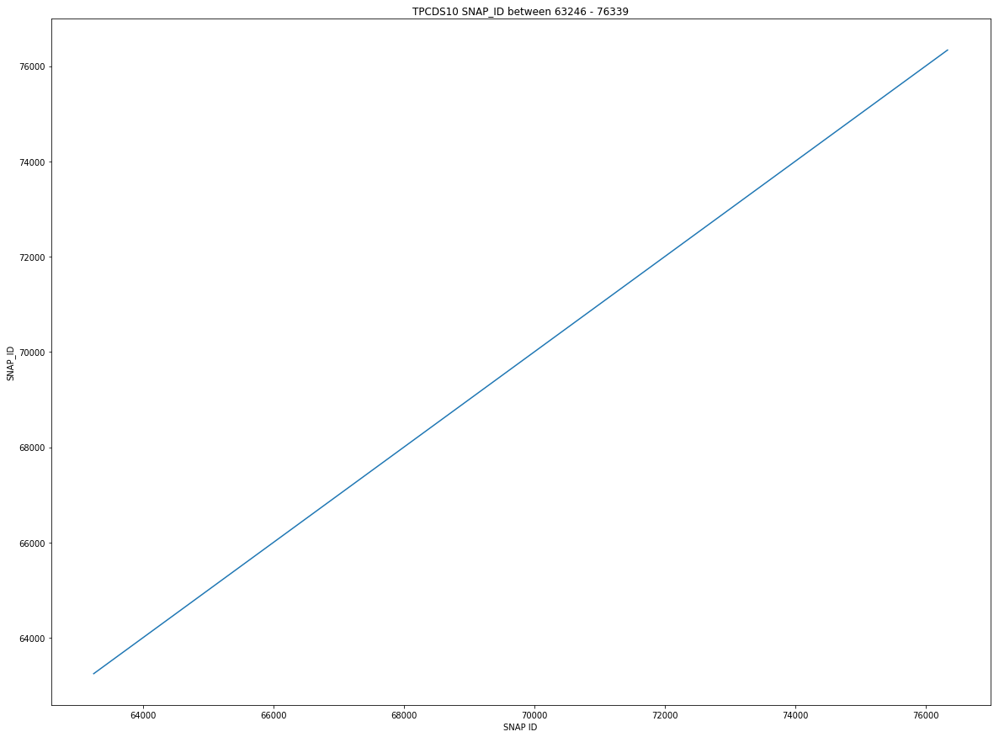

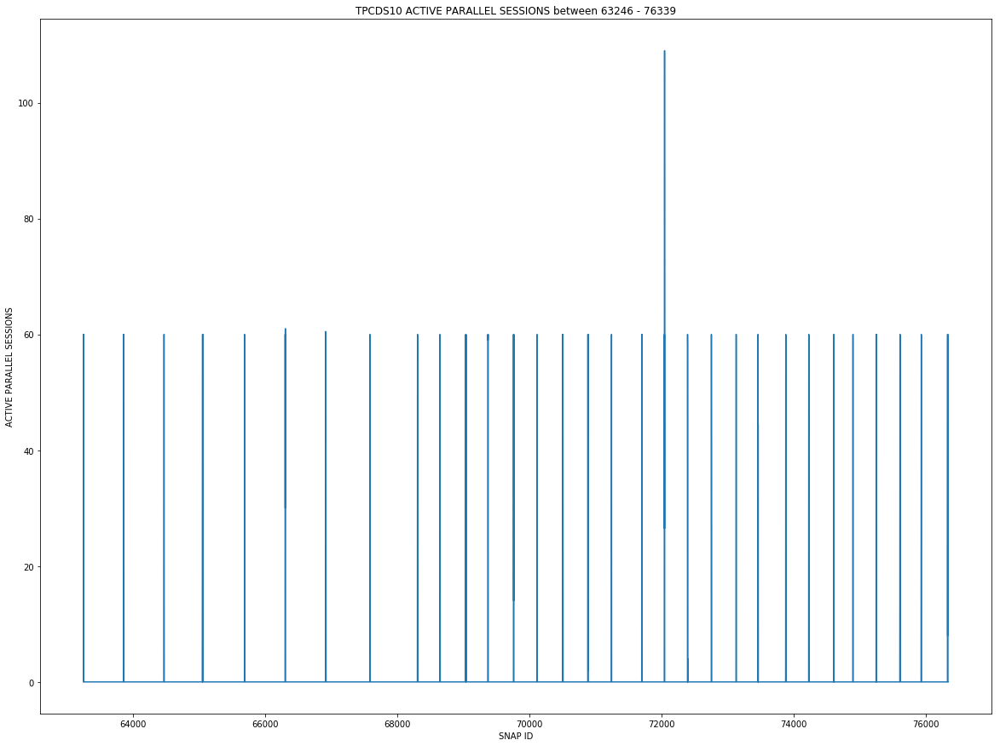

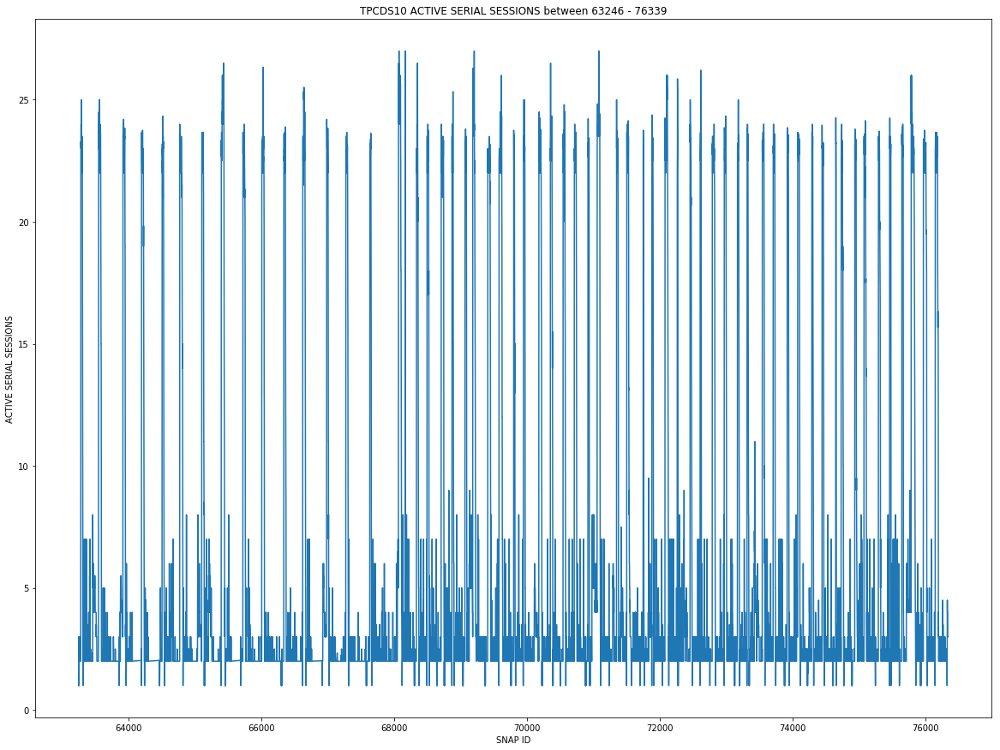

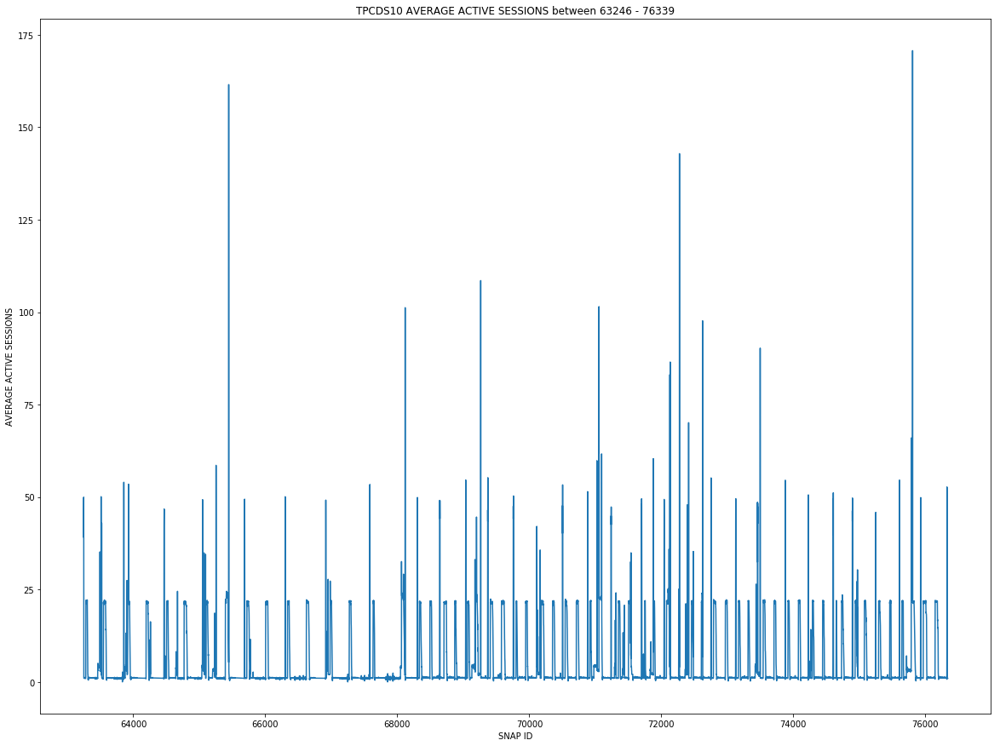

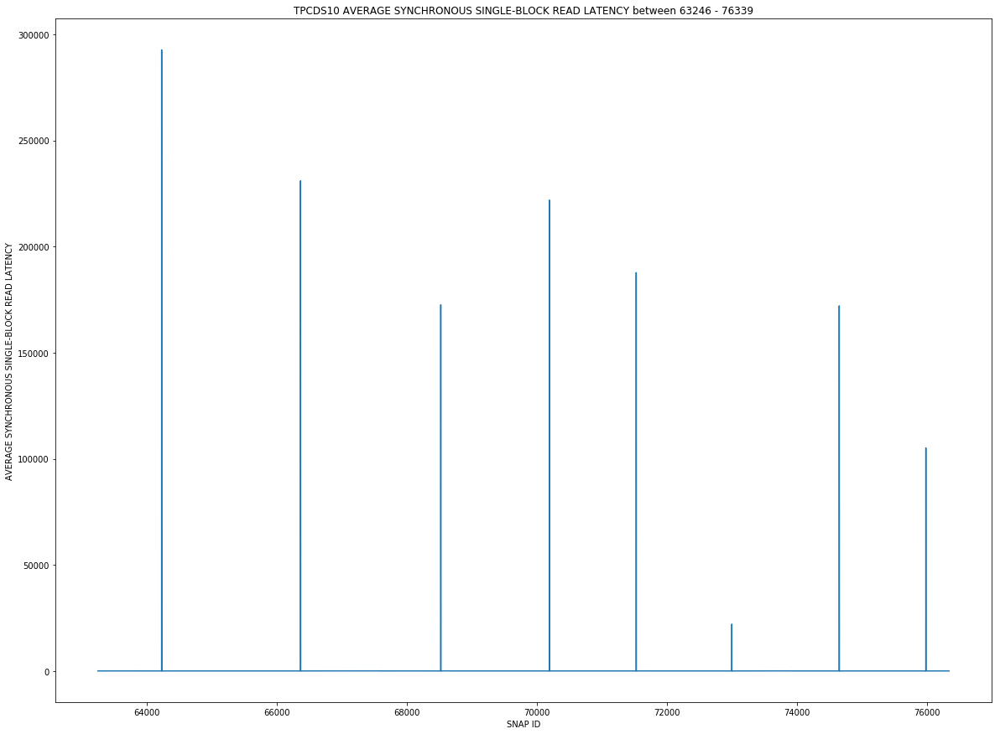

...

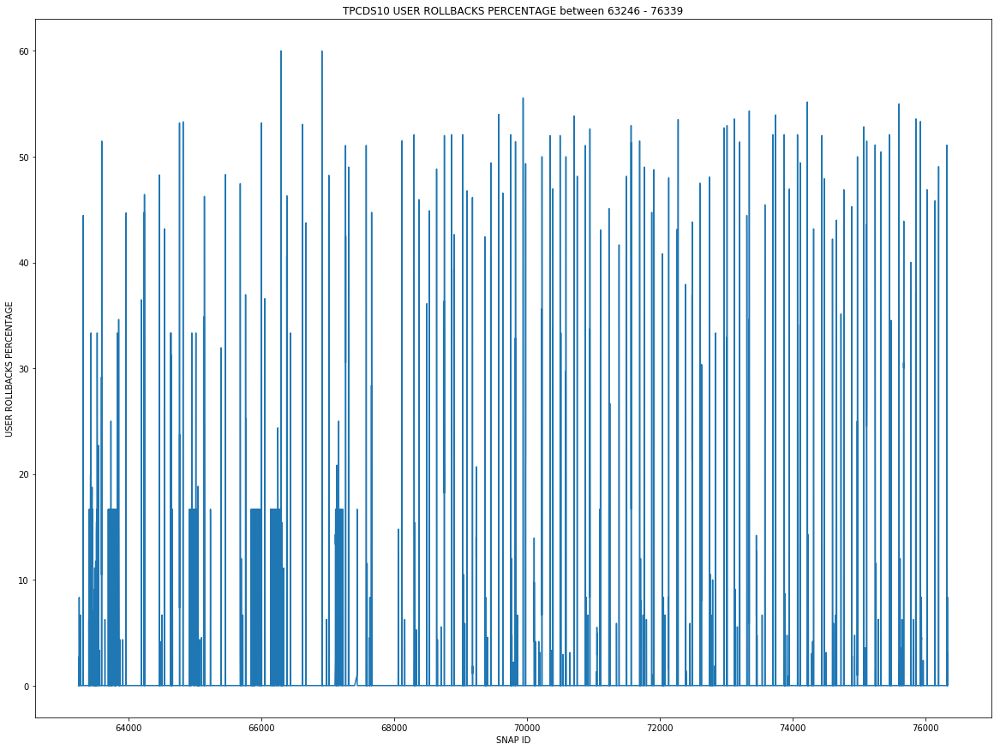

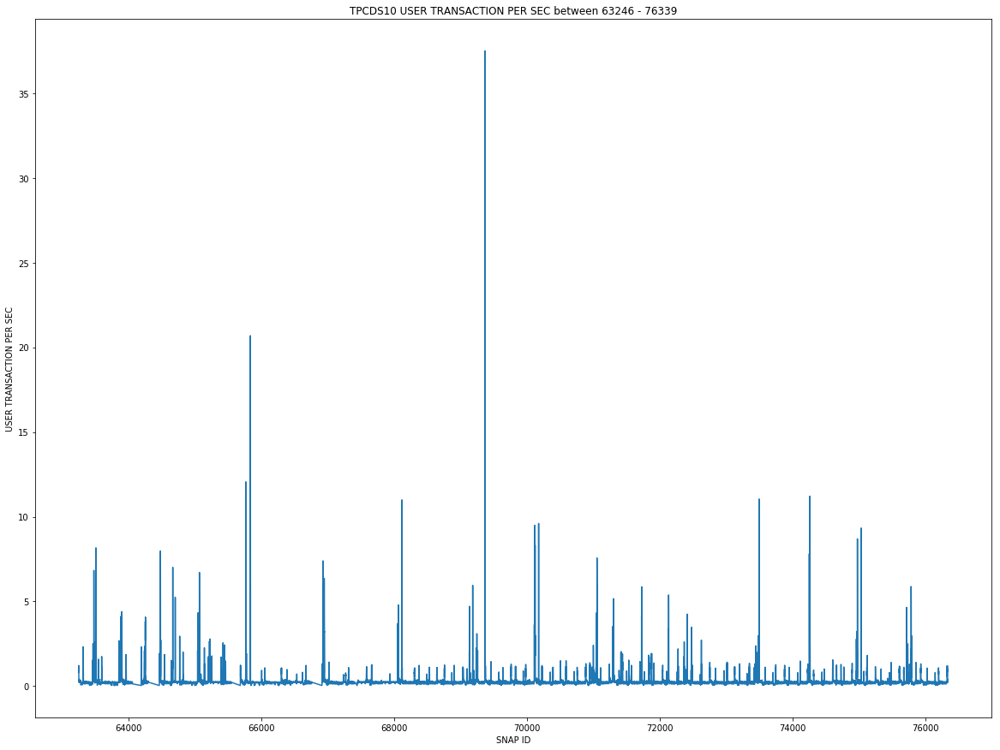

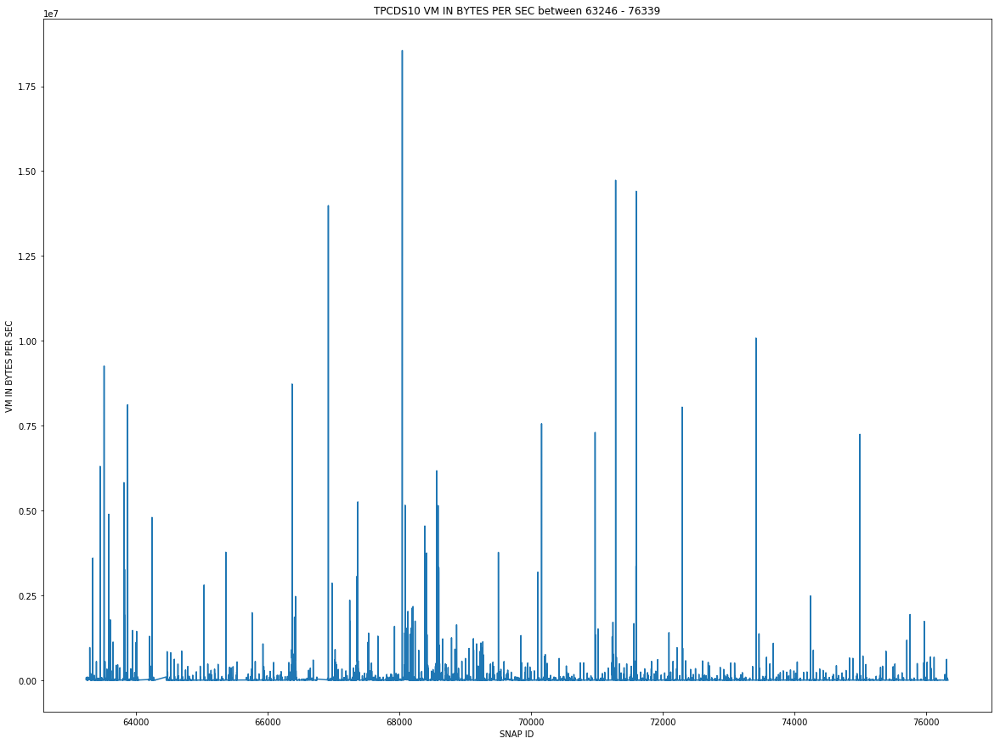

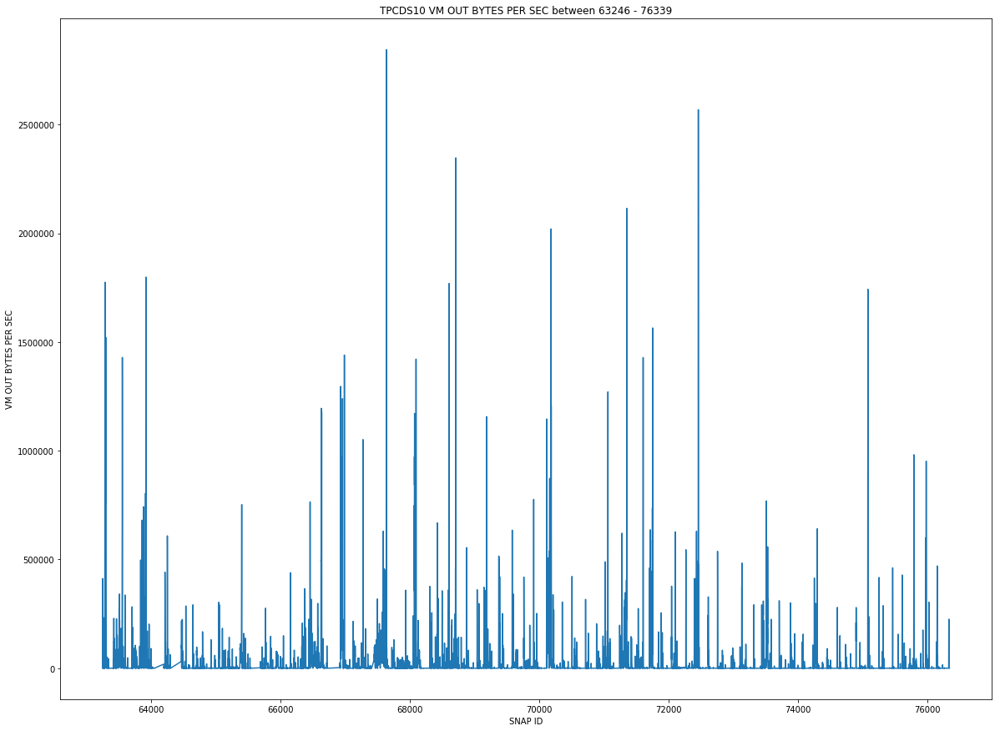

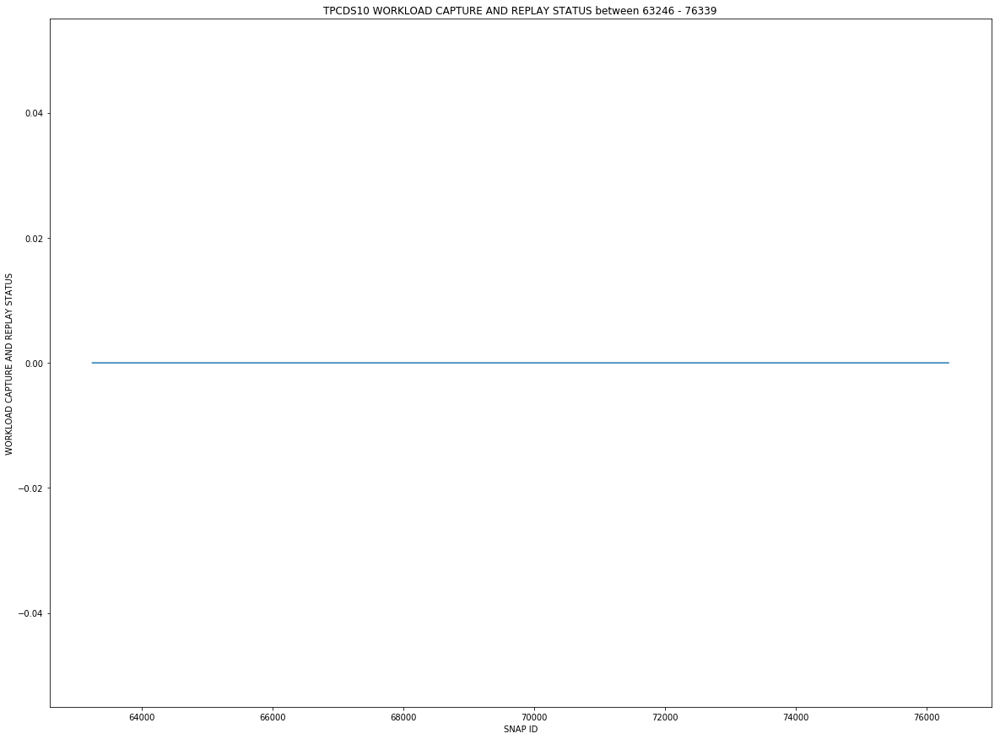

In [8]:
ssv = SnapShotVisualization(table='rep_hist_sysmetric_summary', 
                            tpc_type=tpcds, 
                            df=rep_hist_sysmetric_summary_df)
# Invocation
for header in rep_hist_sysmetric_summary_df.columns:
    ssv.plot_snapshot_distribution(column=header)